In [248]:
import json
from collections import defaultdict
import numpy as np
import random
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import os
import copy
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
from functools import reduce

In [266]:
crack_data = json.load(open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/total.json'))
print(crack_data.keys())
print(crack_data['categories'])
print(len(crack_data['images']))
print(len(crack_data['annotations']))

dict_keys(['info', 'licences', 'images', 'annotations', 'categories'])
[{'supercategory': 'Carparts', 'id': 0, 'name': 'crack'}, {'supercategory': 'Carparts', 'id': 1, 'name': 'broken'}, {'supercategory': 'Carparts', 'id': 2, 'name': 'glass_broken'}, {'supercategory': 'Carparts', 'id': 3, 'name': 'lamp_broken'}, {'supercategory': 'Carparts', 'id': 4, 'name': 'hole'}]
6716
12716


In [314]:
print(type(crack_data['annotations'][0]['category_id']))

<class 'int'>


In [210]:
car_data = json.load(open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/total_car.json'))
print(len(car_data['images']))
print(len(car_data['annotations']))
imgToCarAnns = defaultdict(list)
for ann in car_data['annotations']:
    imgToCarAnns[ann['image_id']].append(ann)
    
print(len(imgToCarAnns.keys()))

6716
11407
5508


In [3]:
imgToAnns = defaultdict(list)
for ann in crack_data['annotations']:
    imgToAnns[ann['image_id']].append(ann)
    
print(len(imgToAnns.keys()))
img_ids = list(imgToAnns.keys())
anno_density = [len(imgToAnns[img_id]) for img_id in img_ids]

6716


In [4]:
damage_classes = []
for cat in crack_data['categories']:
    damage_classes.append(cat['name'])

In [5]:
# return a list of 5 elements. each element indicating a type of damage, it is a defauldict(list): img_id --> that damage annos
def create_damage_to_img_mapping():
    mapping_list = []
    for cls in damage_classes:
        mapping_name = 'imgTo' + str(cls)
        locals()[mapping_name] = defaultdict(list)
        for ann in crack_data['annotations']:
            if damage_classes[ann['category_id']] == str(cls):
                locals()[mapping_name][ann['image_id']].append(ann)
        mapping_list.append(locals()[mapping_name])
    return mapping_list
damage_mapping_list = create_damage_to_img_mapping()
print(len(damage_mapping_list))

5


In [152]:
# np.random.seed(1)
# colors = []
# for i in range (max(anno_density)):
    
#     colors.append((np.random.random((1,3))*0.6+0.4).tolist()[0])
    
def compute_area(seg):
    seg = np.array(seg).reshape(-1,2).astype(np.int32)
    area = cv2.contourArea(seg)
    if area == 0:
        area = 1e-5
    return area
def compute_iou(carpart_mask, damage_mask):
    area1 = np.sum(carpart_mask)
    area2 = np.sum(damage_mask)
    overlap = np.sum(np.logical_and(carpart_mask, damage_mask))
    iou = overlap/(area1+area2-overlap)
    return iou
def draw_binary_mask(seg, img_shape):
    seg = np.array(seg).reshape(-1,2).astype(np.int32)
    mask = np.zeros(img_shape)
    mask = cv2.fillPoly(mask, [seg],1)
    return mask
def draw_masks(num, anno_type):
#     random.seed(3)
    img_ids = random.sample(list(anno_type.keys()), num**2) 
    fig, axs = plt.subplots(num, num, figsize=(15,15))
    
    for i, img_id in enumerate(img_ids):    
        anns = anno_type[img_id]
        
        for img in crack_data['images']:
            if img['id'] == img_id:
                img_name = img['file_name']
                img_url = img['url']
                img_area = img['height']*img['width']
                break
#         print(img_url)
        img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/origin_crack/images/', img_name)
        I = cv2.imread(img_path)
        I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
        
#plot huge mask
#         print('number of annos in this image: ',len(anns))
#         for ann in anns:
#             if compute_area(ann['segmentation'])/img_area >0.3:
#                 cnts = [np.array(ann['segmentation']).reshape(-1,2).astype(int)]
#                 I = cv2.drawContours(I,cnts,-1,(0,255,0),2)      
#                 axs[int(i/num),i%num].imshow(I)
#                 axs[int(i/num),i%num].set_title(img_id)

#plot contours          
        cnts = [np.array(ann['segmentation']).reshape(-1,2).astype(int) for ann in anns]

        I = cv2.drawContours(I,cnts,-1,(0,255,0),4)
        
        axs[int(i/num),i%num].imshow(I)
        axs[int(i/num),i%num].set_title(img_id)
        
        
#plot color mask
#         axs[int(i/num),i%num].imshow(I)
#         axs[int(i/num),i%num].set_title(img_id)
#         color = colors[:len(anns)]
#         print(color)
#         polygons = []
#         for ann in anns:
#             seg = np.array(ann['segmentation']).reshape(-1,2).astype(int)
#             label = damage_classes[ann['category_id']]
            
#             poly = Polygon(seg)
#             polygons.append(poly)

#         p = PatchCollection(polygons, facecolor=color, linewidths=0, alpha=0.5)
#         p.set_label('abc')
#         axs[int(i/num),i%num].add_collection(p)


## visualize

number of images that have broken annotaions: 3136/6716 IMAGES


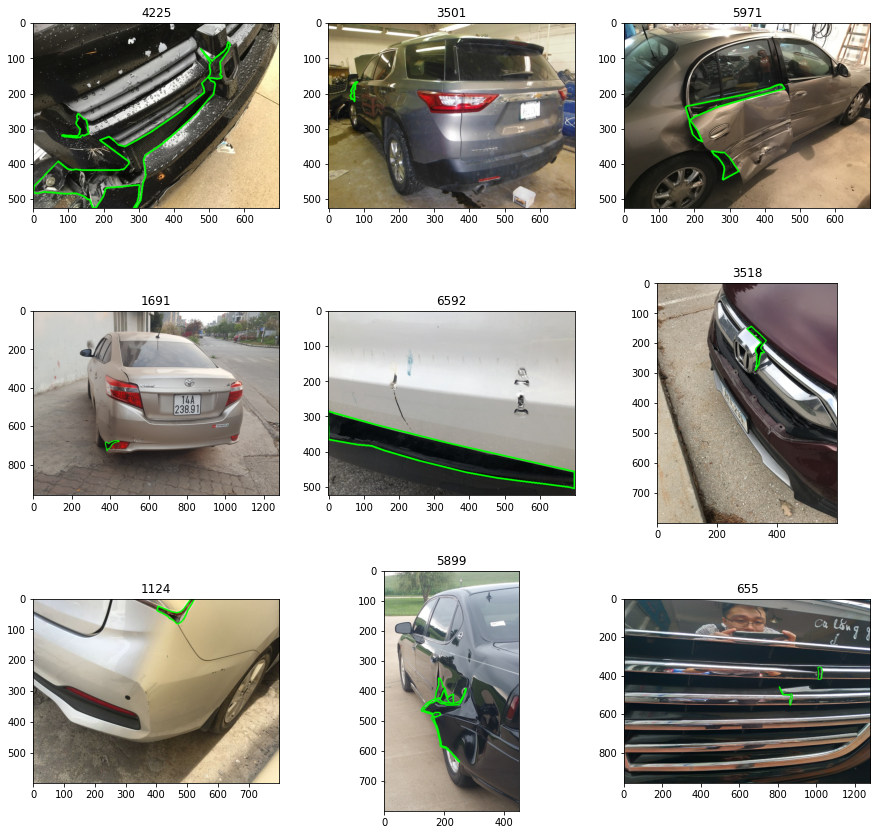

In [189]:
broken_idx = damage_classes.index('broken')
draw_masks(3, damage_mapping_list[broken_idx])
print('number of images that have broken annotaions: {}/{} IMAGES'.format(len(damage_mapping_list[broken_idx].keys()),len(crack_data['images'])))

https://s3.amazonaws.com/mc-imt/vehicle/2019A2735/vehicle_additional_docs/30333/medium/20190703_135722.jpg
https://s3.amazonaws.com/mc-imt/vehicle/2018X6863/vehicle_additional_docs/15614/medium/20181213_191632.jpg
https://s3.amazonaws.com/mc-imt/vehicle/2019X9932/rear_left_view/17406/medium/image.jpg
https://s3.amazonaws.com/mc-imt/vehicle/2019Y9200/detail_damage2/22973/medium/387A4578-9646-4D1C-BFC0-D81AA3BDF127.jpeg


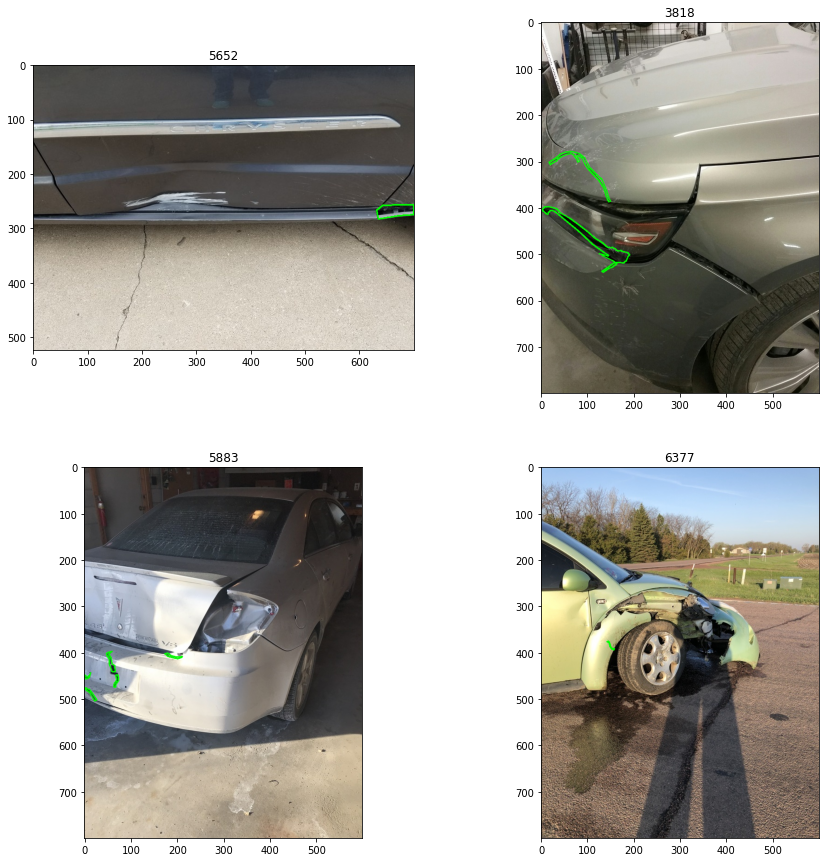

In [7]:
draw_masks(2, imgToAnns)

[{'supercategory': 'Carparts', 'id': 0, 'name': 'crack'}, {'supercategory': 'Carparts', 'id': 1, 'name': 'broken'}, {'supercategory': 'Carparts', 'id': 2, 'name': 'glass_broken'}, {'supercategory': 'Carparts', 'id': 3, 'name': 'lamp_broken'}, {'supercategory': 'Carparts', 'id': 4, 'name': 'hole'}]

number of images that have crack annotaions: 3119/6716 IMAGES


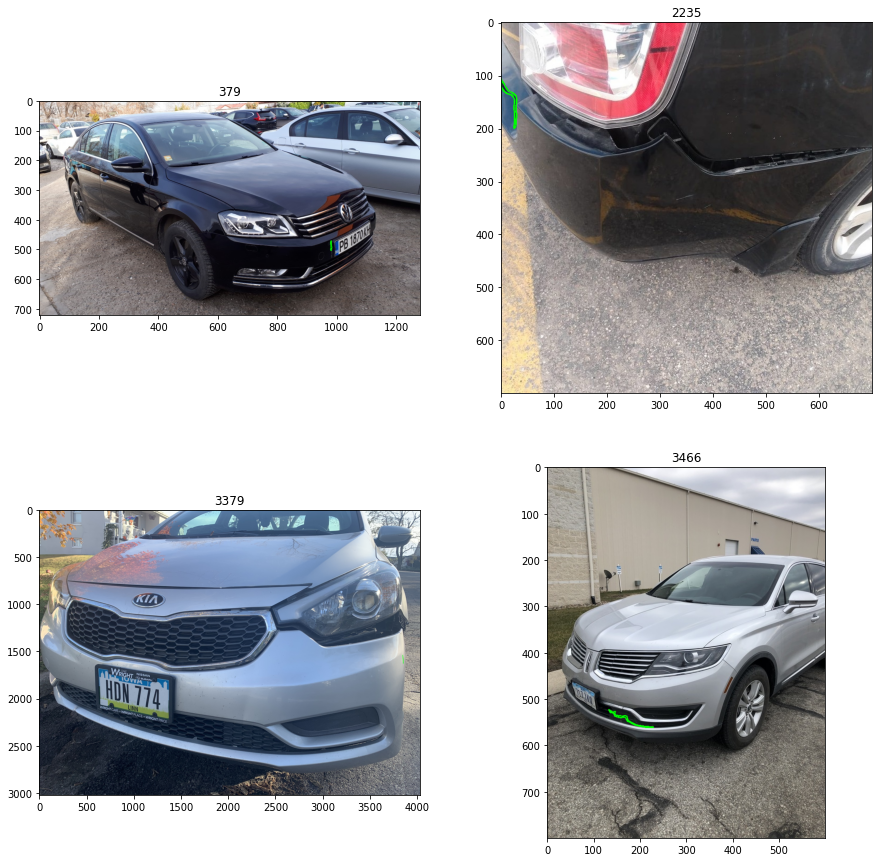

In [90]:
crack_idx = damage_classes.index('crack')
draw_masks(2, damage_mapping_list[crack_idx])
print('number of images that have crack annotaions: {}/{} IMAGES'.format(len(damage_mapping_list[crack_idx].keys()),len(crack_data['images'])))

https://s3.amazonaws.com/mc-ai/vn_car/thinh_anh_3_luu_tru/boi thuong thang 8/PC 14A - 014.72 - 08.08.2018/z1077189761130_1d78c36e4da44b7eb22309c5e70ea8ee.jpg
https://s3.amazonaws.com/mc-ai/vn_car/thinh_anh_3_luu_tru/Boi thuong thang 7/PAGS/z1058527647766_998bc79a59dd95b804b39446e0dcd78e.jpg
https://s3.amazonaws.com/mc-imt/vehicle/2020C7811/detail_damage1/44417/medium/A97E781B-3F96-4C61-AD76-A47C9BB286F8.jpeg
https://s3.amazonaws.com/mc-imt/vehicle/2019Z7881/detail_damage1/27769/medium/image.jpg
number of images that have glass_broken annotaions: 552/6716 IMAGES


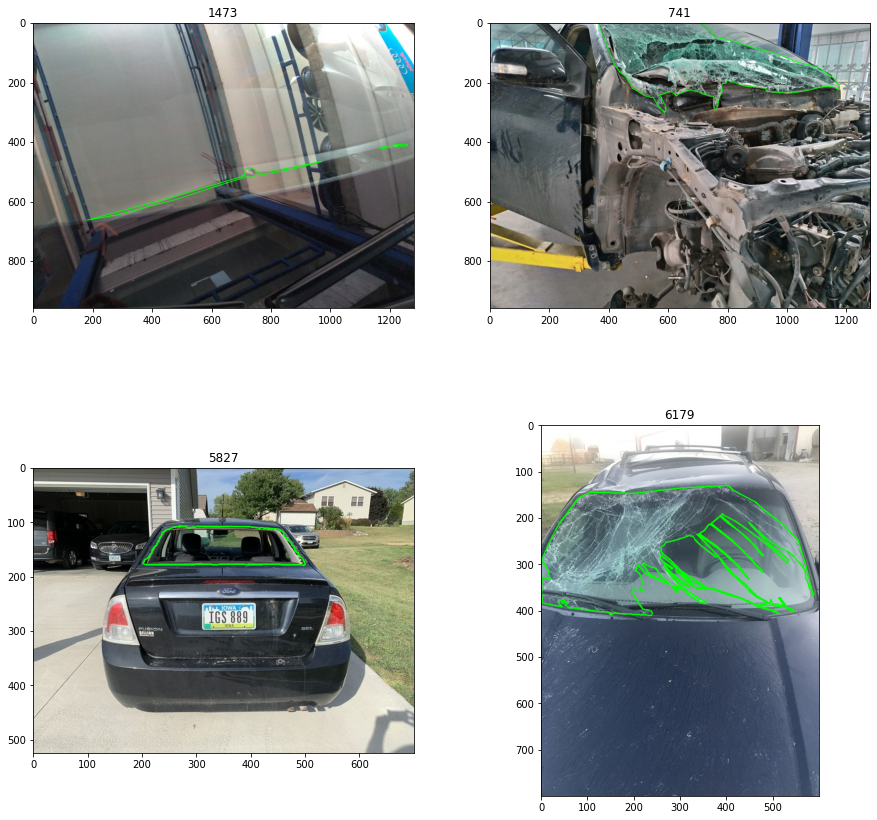

In [10]:
glass_broken_idx = damage_classes.index('glass_broken')
draw_masks(2, damage_mapping_list[glass_broken_idx])
print('number of images that have glass_broken annotaions: {}/{} IMAGES'.format(len(damage_mapping_list[glass_broken_idx].keys()),len(crack_data['images'])))

number of images that have lamp_broken annotaions: 1597/6716 IMAGES


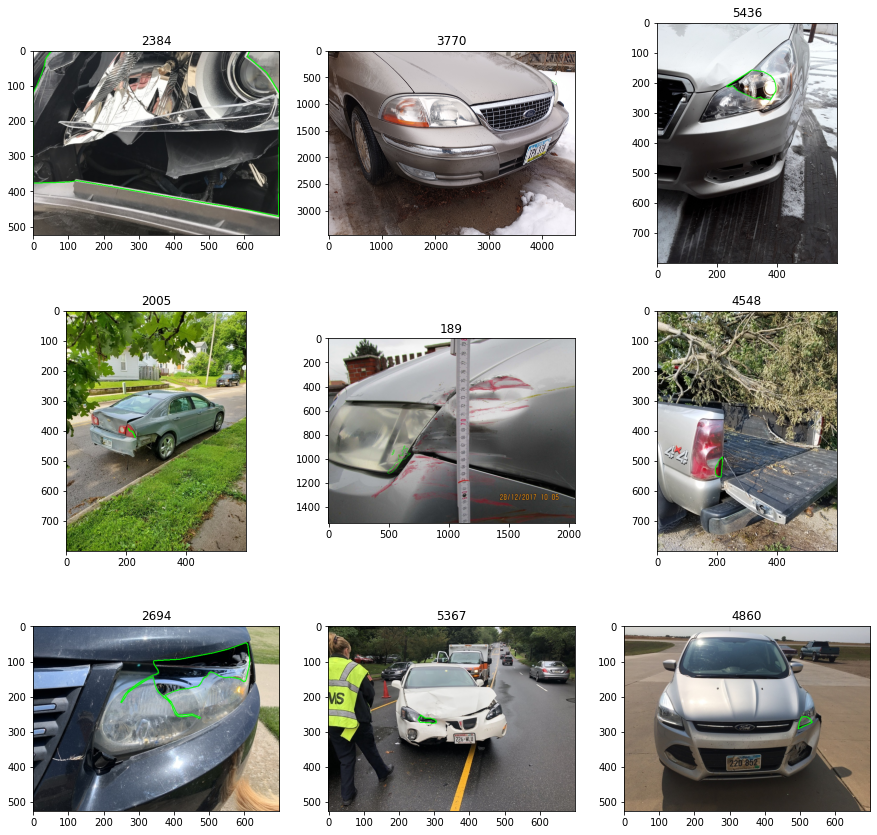

In [92]:
lamp_broken_idx = damage_classes.index('lamp_broken')
draw_masks(3, damage_mapping_list[lamp_broken_idx])
print('number of images that have lamp_broken annotaions: {}/{} IMAGES'.format(len(damage_mapping_list[lamp_broken_idx].keys()),len(crack_data['images'])))

https://s3.amazonaws.com/mc-imt/vehicle/2020D2815/front_right_view/49730/medium/15979373161748920092913604190639.jpg
https://s3.amazonaws.com/mc-imt/vehicle/2019Z0772/rear_left_view/23872/medium/20190529_164038.jpg
https://s3.amazonaws.com/mc-ai/vn_car/thinh_anh_3_luu_tru/Boi thuong thang 10/LG 14C - 247.00 -27.10.2018/z1159210385432_630520c13b804353e09edc9b7be734c3.jpg
https://s3.amazonaws.com/mc-imt/vehicle/2020C8905/detail_damage1/44350/medium/15971802308993520101563333751229.jpg
number of images that have hole annotaions: 200/6716 IMAGES


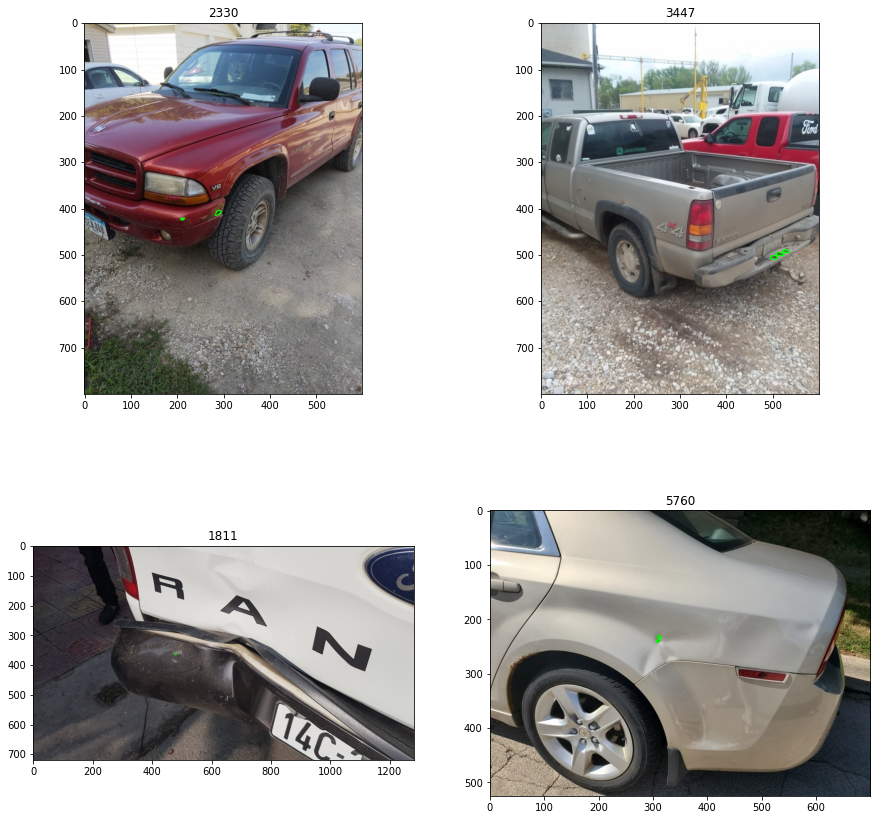

In [22]:
hole_idx = damage_classes.index('hole')
draw_masks(2, damage_mapping_list[hole_idx])
print('number of images that have hole annotaions: {}/{} IMAGES'.format(len(damage_mapping_list[hole_idx].keys()),len(crack_data['images'])))

## crack

In [308]:
imgToCrack = damage_mapping_list[crack_idx]
# crack_area_dist = []
# for img_id, crack_anns in imgToCrack.items():
#     for crack_ann in crack_anns:
#         crack_area_dist.append(compute_area(crack_ann['segmentation']))
        
        
crack_iou_list =[]
large_crack = defaultdict(list)
tiny_crack = defaultdict(list)
crack_car_ratio =[]
for img_id, crack_anns in imgToCrack.items():
    car_anns = imgToCarAnns[img_id]
    for img in crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
    img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/origin_crack/images/', img_name)
    I = cv2.imread(img_path)
    img_shape = I.shape[:2]
    crack_segs = [draw_binary_mask(ann['segmentation'], img_shape) for ann in crack_anns]
    car_segs = [draw_binary_mask(ann['segmentation'], img_shape) for ann in car_anns]
    
    
    for i, crack_seg in enumerate(crack_segs):
        for car_seg in car_segs:
            iou = compute_iou(car_seg, crack_seg)
            crack_iou_list.append(iou)
            crack_car_ratio.append(np.sum(crack_seg)/np.sum(car_seg))
            if iou>0.04:
                large_crack[img_id].append(crack_anns[i])
            if iou<0.00025 and iou>0:
                tiny_crack[img_id].append(crack_anns[i])


7477


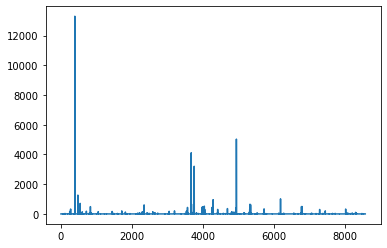

In [285]:
plt.plot(crack_car_ratio)
print(len([small_ratio for small_ratio in crack_car_ratio if small_ratio <0.5]))

988
16


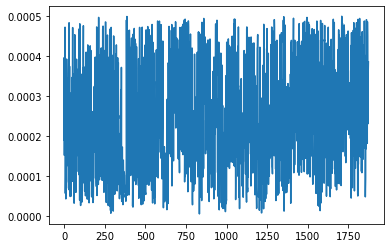

In [307]:
plt.plot([iou for iou in crack_iou_list if iou>0 and iou < 0.0005])
print(len([small_iou for small_iou in crack_iou_list if small_iou < 0.00025 and small_iou >0]))
print(len([large_iou for large_iou in crack_iou_list if large_iou > 0.04]))

16


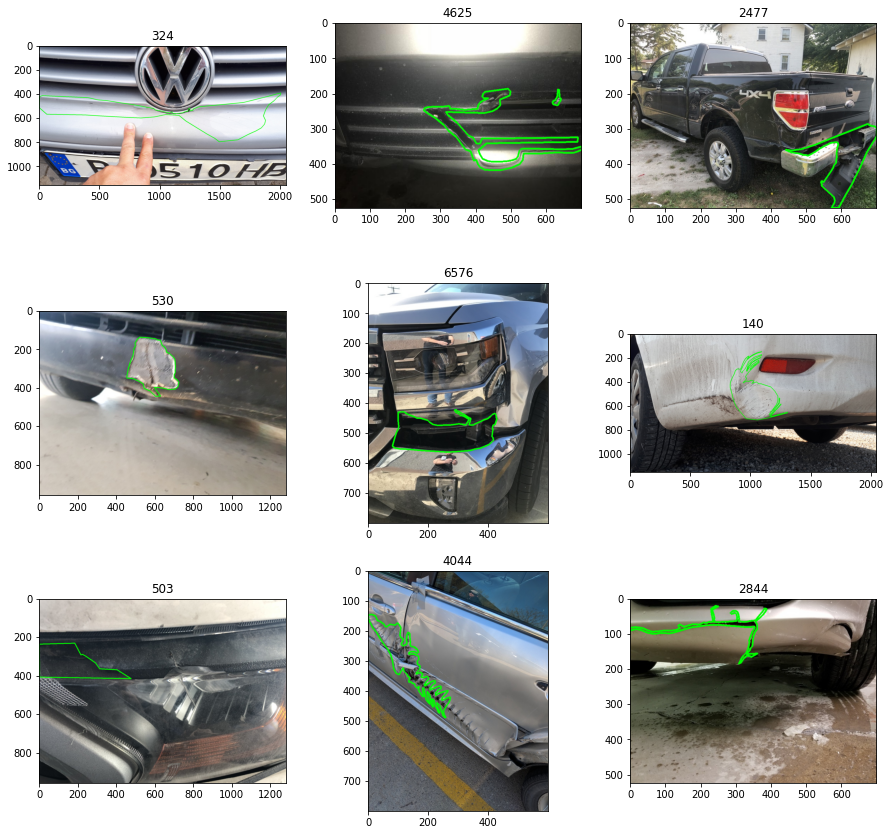

In [294]:
print(len(reduce(lambda x,y: x+y, list(large_crack.values()))))
draw_masks(3, large_crack)


598
988


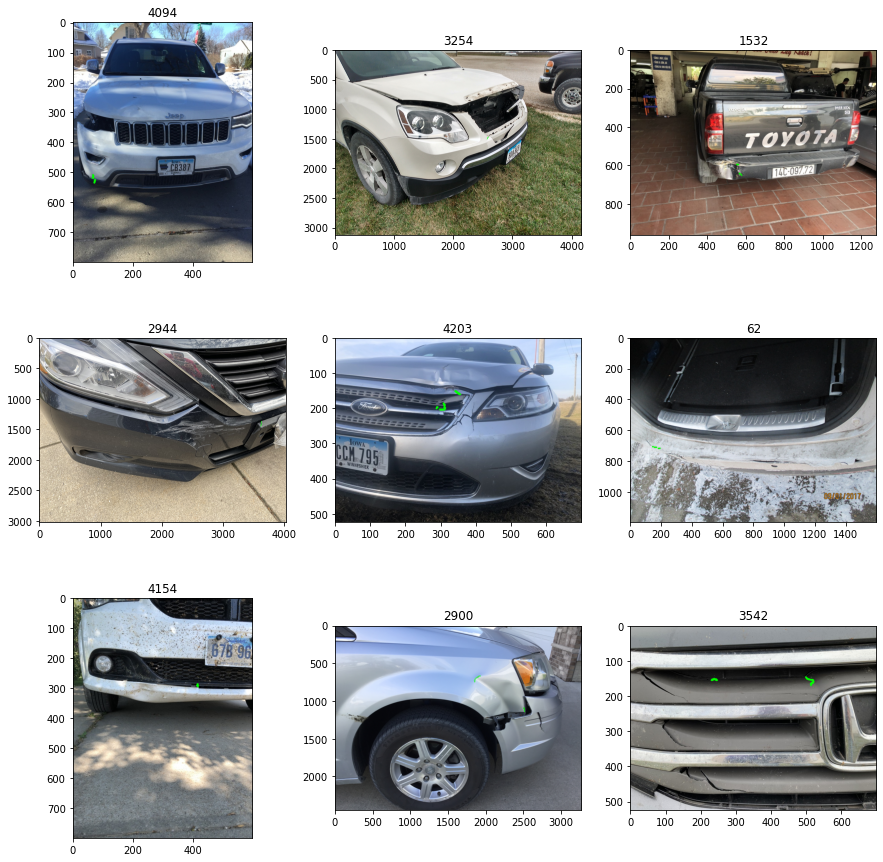

In [309]:
print(len(tiny_crack.keys()))
print(len(reduce(lambda x,y: x+y, list(tiny_crack.values()))))

draw_masks(3, tiny_crack)

## broken

In [224]:
imgToBroken = damage_mapping_list[broken_idx]
broken_iou_list =[]
large_broken = defaultdict(list)
tiny_broken = defaultdict(list)
for img_id, broken_anns in imgToBroken.items():
    car_anns = imgToCarAnns[img_id]
    for img in crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
    img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/origin_crack/images/', img_name)
    I = cv2.imread(img_path)
    img_shape = I.shape[:2]
    broken_segs = [draw_binary_mask(ann['segmentation'], img_shape) for ann in broken_anns]
    car_segs = [draw_binary_mask(ann['segmentation'], img_shape) for ann in car_anns]
    
    
    for i, broken_seg in enumerate(broken_segs):
        for car_seg in car_segs:
            iou = compute_iou(car_seg, broken_seg)
            broken_iou_list.append(iou)
            if iou>0.05:
                large_broken[img_id].append(broken_anns[i])
            if iou<0.05 and iou>0:
                tiny_broken[img_id].append(broken_anns[i])


In [225]:
print(len(imgToBroken.values()))
print(len(large_broken.values()))
print(len(tiny_broken.values()))

3136
843
2283


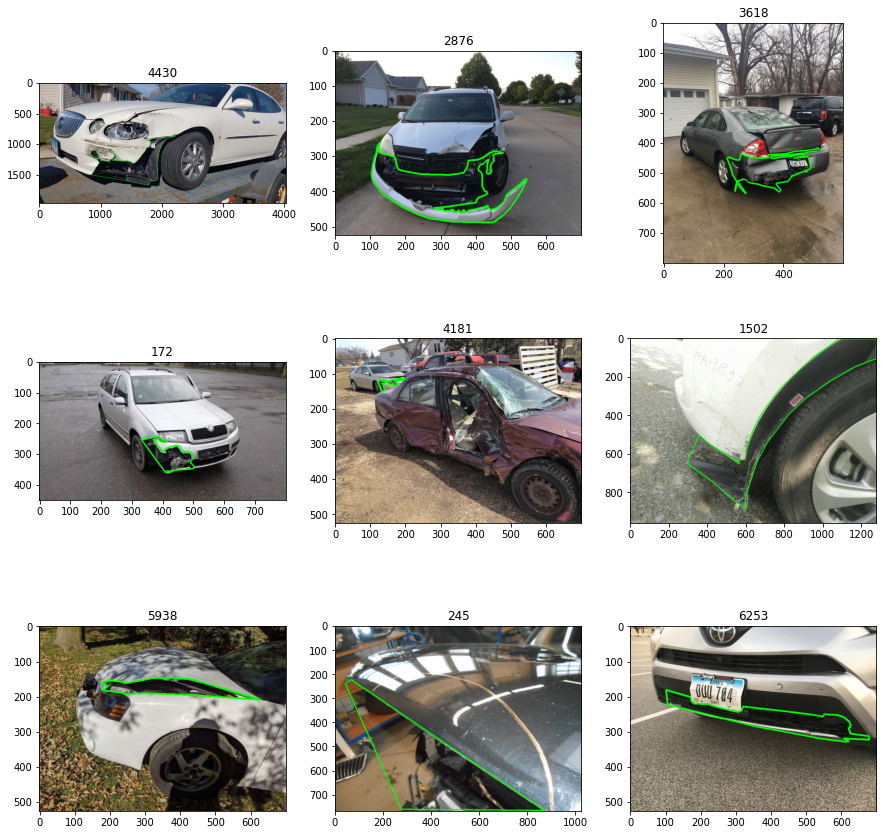

In [234]:
draw_masks(3, large_broken)

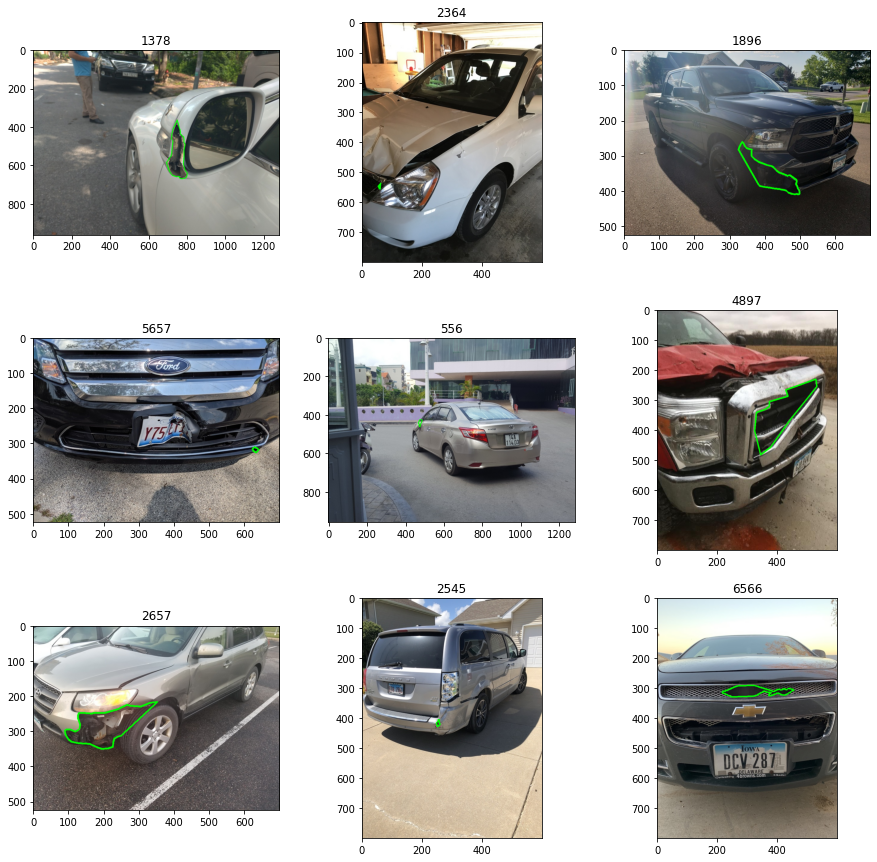

In [237]:
draw_masks(3, tiny_broken)

number of images that has broken:  3136
number of broken annotations:  3961
number of broken annos
mean 1.2630739795918366
min 1
max 8
----------


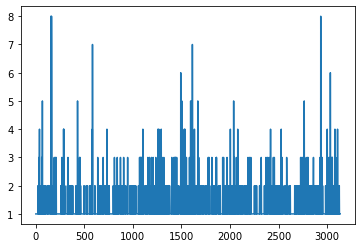

In [73]:
imgToBroken = damage_mapping_list[broken_idx]
num_broken_anns = [len(anns) for img_id, anns in imgToBroken.items()]
print('number of images that has broken: ', len(imgToBroken.keys()))
print('number of broken annotations: ', np.sum(num_broken_anns))
# for ann in imgToBroken.values():
print('number of broken annos')
print('mean', np.mean(num_broken_anns))
print('min', np.min(num_broken_anns))
print('max', np.max(num_broken_anns))
print('-'*10)
plt.plot(num_broken_anns)

#plot the image with the most broken damage
# print(np.argmax(num_broken_anns))
# img_id = list(imgToBroken.keys())[np.argmax(num_broken_anns)]
# annos = list(imgToBroken.values())[np.argmax(num_broken_anns)]
#plot_img(img_id, annos)

In [102]:
def plot_img(img_id, annos):
    
    for img in crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
#         print(img_url)
    img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/origin_crack/images/', img_name)
    I = cv2.imread(img_path)
    I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)

    cnts = [np.array(ann['segmentation']).reshape(-1,2).astype(int) for ann in annos]

    I = cv2.drawContours(I,cnts,-1,(0,255,0),2)
    plt.imshow(I)

mean 0.5309311224489796
min 0
max 8
num of broken annos:  3136
number of images that have large broken: 1326
number of large broken damage:  1326
each image have only one large broken damage


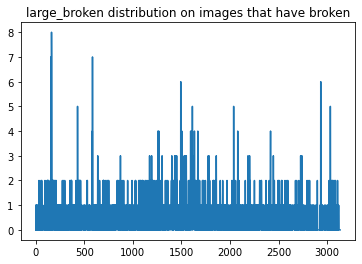

In [202]:
large_broken_distribution = [0] * len(imgToBroken.keys())
large_broken = defaultdict(list)
for (i, (img_id, anns)) in enumerate(imgToBroken.items()):
    for img in crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
    for ann in anns:
        if(compute_area(ann['segmentation'])/img_area)<0.005:           
            large_broken_distribution[i] += 1
            large_broken[img_id]=anns

print('mean', np.mean(large_broken_distribution))
print('min', np.min(large_broken_distribution))
print('max', np.max(large_broken_distribution))
large_broken_images = [i for i in large_broken_distribution if i >0]
print('num of broken annos: ', len(imgToBroken.values()))
print('number of images that have large broken:', len(large_broken_images))
print('number of large broken damage: ', len(large_broken.values()))
plt.plot(large_broken_distribution)
plt.title('large_broken distribution on images that have broken')

print('each image have only one large broken damage')

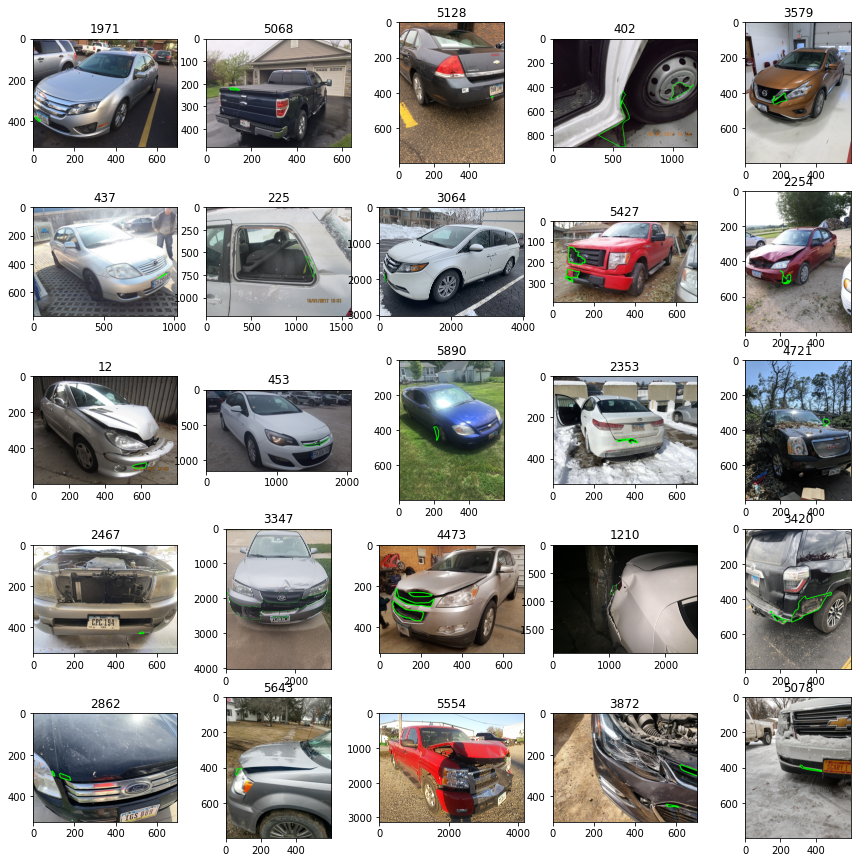

In [205]:
draw_masks(5, large_broken)

## lamp_broken

In [110]:
carpart_config = '/mmdetection/checkpoints/carpart_phase_2/carpart_pseudo.py'
carpart_checkpoint = '/mmdetection/checkpoints/carpart_phase_2/epoch_24.pth'
carpart_model = init_detector(carpart_config, carpart_checkpoint, device='cuda:1')
carpart_labels = carpart_model.CLASSES
def load_predicted_result(model, img, conf_score=0.5):
    result = inference_detector(model, img.copy())
    out_image,pd_boxes,pd_segs,pd_labels,pd_scores = show_result_pyplot(model,img.copy(),result,score_thr=conf_score)
    return pd_segs,pd_labels,pd_scores,out_image

/mmdetection/mmdet/core/anchor/builder.py:15: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  warnings.warn(


load checkpoint from local path: /mmdetection/checkpoints/carpart_phase_2/epoch_24.pth


In [107]:
carpart_labels

['sli_side_turn_light',
 'tyre',
 'alloy_wheel',
 'hli_head_light',
 'hood',
 'fwi_windshield',
 'flp_front_license_plate',
 'door',
 'mirror',
 'handle',
 'qpa_quarter_panel',
 'fender',
 'grille',
 'fbu_front_bumper',
 'rocker_panel',
 'rbu_rear_bumper',
 'pillar',
 'roof',
 'blp_back_license_plate',
 'window',
 'rwi_rear_windshield',
 'tail_gate',
 'tli_tail_light',
 'fbe_fog_light_bezel',
 'fli_fog_light',
 'fuel_tank_door',
 'lli_low_bumper_tail_light']

In [109]:
light_labels = ['sli_side_turn_light','hli_head_light','tli_tail_light','fli_fog_light','lli_low_bumper_tail_light']

number of images that has lamp broken:  1597
number of lamp broken annotations:  1976
number of broken annos
mean 1.237319974953037
min 1
max 10
----------


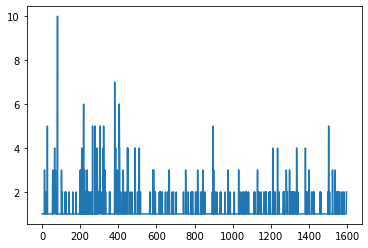

In [97]:
imgToLamp_broken = damage_mapping_list[lamp_broken_idx]
num_lamp_broken_anns = [len(anns) for img_id, anns in imgToLamp_broken.items()]
print('number of images that has lamp broken: ', len(imgToLamp_broken.keys()))
print('number of lamp broken annotations: ', np.sum(num_lamp_broken_anns))
# for ann in imgToBroken.values():
print('number of broken annos')
print('mean', np.mean(num_lamp_broken_anns))
print('min', np.min(num_lamp_broken_anns))
print('max', np.max(num_lamp_broken_anns))
print('-'*10)
plt.plot(num_lamp_broken_anns)

img_idx:  81


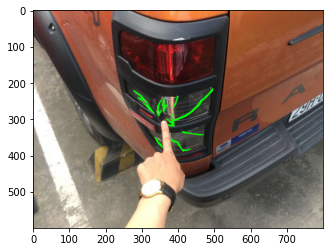

In [105]:
# plot the image with the most lamp broken damage
print('img_idx: ',np.argmax(num_lamp_broken_anns))
img_id = list(imgToLamp_broken.keys())[np.argmax(num_lamp_broken_anns)]
annos = list(imgToLamp_broken.values())[np.argmax(num_lamp_broken_anns)]
plot_img(img_id, annos)

[ 3  4 13] (3,)
['hli_head_light', 'hood', 'fbu_front_bumper']


/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/mmdetection/mmdet/core/anchor/anchor_generator.py:359: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


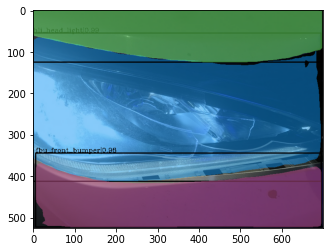

In [341]:
img_id = 3890
for img in crack_data['images']:
    if img['id'] == img_id:
        img_name = img['file_name']
        img_url = img['url']
        img_area = img['height']*img['width']
        break
img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/origin_crack/images/', img_name)
I = cv2.imread(img_path)
I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
pd_segs,pd_labels,pd_scores,out_image = load_predicted_result(carpart_model, I)
plt.imshow(out_image)
print(pd_labels,pd_labels.shape)
print([carpart_labels[idx] for idx in pd_labels])

# plot_img(img_id, imgToLamp_broken[img_id])

In [168]:

iou_list=[]
large_lamp_broken = defaultdict(list)
tiny_lamp_broken = defaultdict(list)
for (idx, (img_id, broken_anns)) in enumerate(imgToLamp_broken.items()):
#     if idx >300:
#         break
    for img in crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
    
    img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/origin_crack/images/', img_name)
    I = cv2.imread(img_path)
    img_shape = I.shape[:2]
    I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
    broken_segs = [draw_binary_mask(ann['segmentation'], img_shape) for ann in broken_anns]

    pd_segs,pd_labels,pd_scores,out_image = load_predicted_result(carpart_model, I)
    light_segs = [pd_segs[idx] for idx,pd_label in enumerate(pd_labels) if (carpart_labels[pd_label] in light_labels)]
    
    if len(light_segs) == 0:
        continue
#     print(len(broken_segs), len(light_segs), img_id)
 
    for i, broken_seg in enumerate(broken_segs):
        for light_seg in light_segs:
            iou = compute_iou(light_seg, broken_seg)
            iou_list.append(iou)
            if iou>0.6:
                large_lamp_broken[img_id].append(broken_anns[i])
            if iou<0.1 and np.sum(broken_seg)/img_area < 0.2:
                tiny_lamp_broken[img_id].append(broken_anns[i])

/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/mmdetection/mmdet/core/anchor/anchor_generator.py:359: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


In [169]:
print(np.max(iou_list))
print(np.min(iou_list))
print('number of huge lamp broken annotations: ', len(large_lamp_broken.values()))
print('number of tiny lamp broken annotations: ', len(tiny_lamp_broken.values()))

0.9672764098993607
0.0
number of huge lamp broken annotations:  335
number of tiny lamp broken annotations:  1026


0.14392998218856384
0.24296617440493376


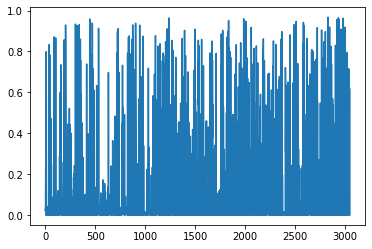

In [162]:
plt.plot(iou_list)
print(np.mean(iou_list))
print(np.std(iou_list))


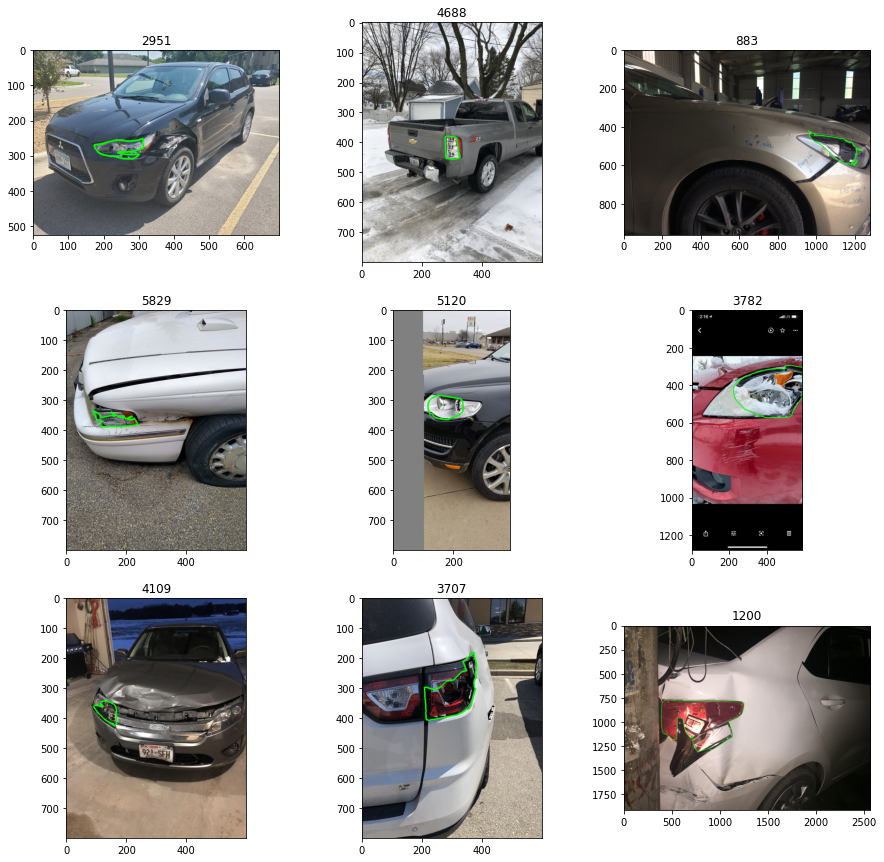

In [173]:
draw_masks(3, large_lamp_broken)

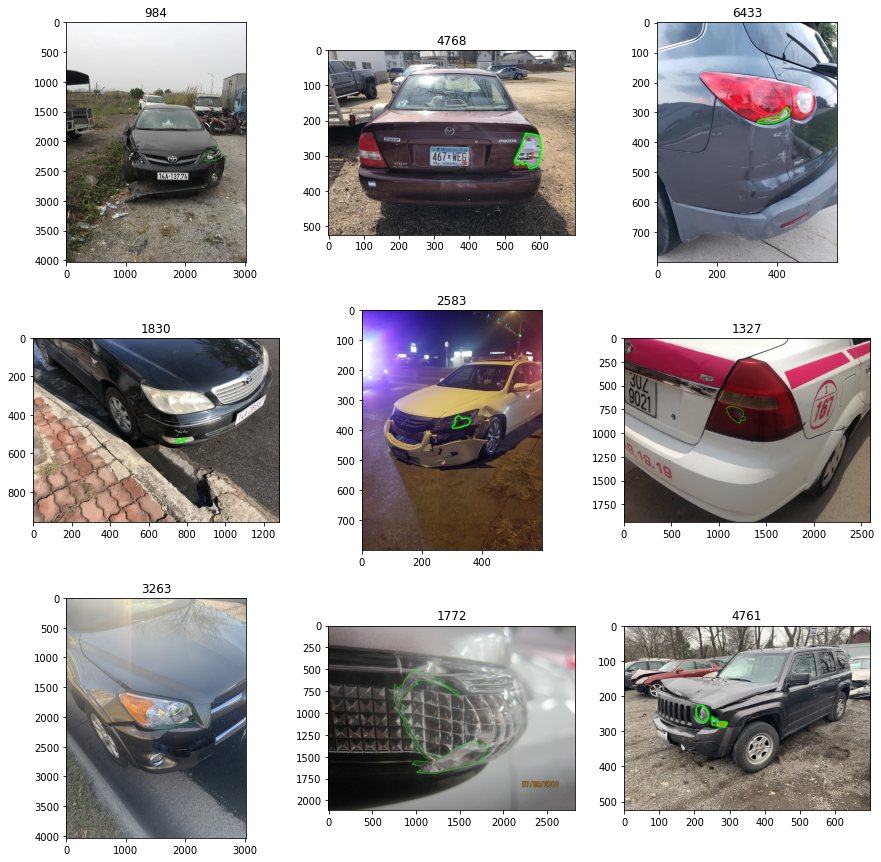

In [171]:
draw_masks(3, tiny_lamp_broken)

## Hole

In [179]:
imgToHole = damage_mapping_list[hole_idx]
print(len(imgToHole.values()))
tiny_hole = defaultdict(list)
for img_id, hole_anns in imgToHole.items():
    for img in crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
    for hole_ann in hole_anns:
        if(compute_area(hole_ann['segmentation'])/img_area<10e-5):
            tiny_hole[img_id].append(hole_ann)
print('num of tiny hole anno:', len(tiny_hole.values()))   

200
num of tiny hole anno: 71


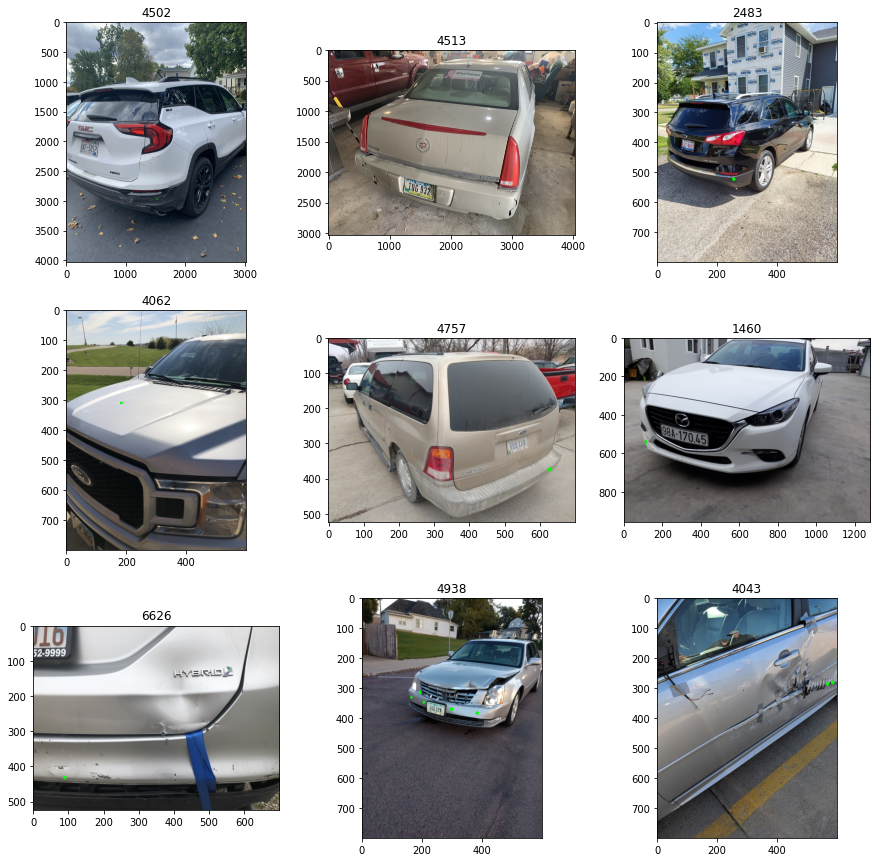

In [180]:
draw_masks(3, tiny_hole)

## create new crack dataset

In [268]:
def double_check(data):
    img_ids = [img['id'] for img in data['images']]
    img_ids_in_annos = set([ann['image_id'] for ann in data['annotations']])
    differential_quant = len(img_ids) - len(img_ids_in_annos)
    if (differential_quant <= 0):
        print("check 'double_check' function again")
    else:
        print('have positive differential quantity')
        new_images = []
        for img in data['images']:
            if img['id'] in img_ids_in_annos:
                new_images.append(img)
        data['images'] = new_images
    return data

### crack dataset without broken

In [324]:

glass_broken_idx = damage_classes.index('glass_broken')
imgToGlass_broken = damage_mapping_list[glass_broken_idx]

total_removed_anns_v1= list(tiny_hole.values()) + list(large_broken.values()) + list(large_lamp_broken.values()) + list(imgToGlass_broken.values()) + list(tiny_crack.values()) + list(large_crack.values())
total_removed_anns_v1 = reduce(lambda x,y: x+y, total_removed_anns_v1)
print(len(total_removed_anns_v1))

new_crack_data_v1 = copy.deepcopy(crack_data)
new_crack_data_v1['annotations'] = [ann for ann in new_crack_data_v1['annotations'] if ann not in total_removed_anns_v1]
new_crack_data_v1['categories'] = [{'supercategory': 'Carparts', 'id': 0, 'name': 'crack'}]
for ann in new_crack_data_v1['annotations']:
    ann['category_id'] = 0
double_check(new_crack_data_v1)
path_v1 = '/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/clean_crack_v1.json'

with open(path_v1, 'w', encoding='utf-8') as json_file:
    json.dump(new_crack_data_v1, json_file, ensure_ascii=False, indent=4)


print(len(crack_data['annotations']))
print(len(new_crack_data_v1['annotations']))
print(len(crack_data['annotations'])-len(new_crack_data_v1['annotations']))
print('-'*100)
print(len(new_crack_data_v1['images']))


3520
have positive differential quantity
12716
9379
3337
----------------------------------------------------------------------------------------------------
5393


### crack dataset with broken

In [319]:
total_removed_anns_v2= list(tiny_hole.values()) + list(large_lamp_broken.values()) + list(imgToGlass_broken.values()) + list(tiny_crack.values()) + list(large_crack.values())
total_removed_anns_v2 = reduce(lambda x,y: x+y, total_removed_anns_v2)
print(len(total_removed_anns_v2))

new_crack_data_v2 = copy.deepcopy(crack_data)
new_crack_data_v2['annotations'] = [ann for ann in new_crack_data_v2['annotations'] if ann not in total_removed_anns_v2]
new_crack_data_v2['categories'] = [{'supercategory': 'Carparts', 'id': 0, 'name': 'crack'}, {'supercategory': 'Carparts', 'id': 1, 'name': 'broken'}]

for ann in new_crack_data_v2['annotations']:
    if ann['category_id'] != 1:
        ann['category_id'] = 0
double_check(new_crack_data_v2)

print(len(crack_data['annotations']))
print(len(new_crack_data_v2['annotations']))
print(len(crack_data['annotations'])-len(new_crack_data_v2['annotations']))
print('-'*100)
print(len(new_crack_data_v2['images']))


2586
have positive differential quantity
12716
10246
2470
----------------------------------------------------------------------------------------------------
5892


In [323]:

path_v2 = '/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/clean_crack_v2.json'
    
with open(path_v2, 'w', encoding='utf-8') as json_file:
    json.dump(new_crack_data_v2, json_file, ensure_ascii=False, indent=4)

## split train/val/test dataset

In [333]:
len(new_crack_data_v1['images'])

5393

In [338]:
def anno_mapping(data, imgs_dest):
    img_ids = [img['id'] for img in imgs_dest]
    ann_dest = [ann for ann in data['annotations'] if ann['image_id'] in img_ids]
    return ann_dest
def data_splitter(data_list, ratio):
    data_len = len(data_list)
    anchor1 = int(ratio[0] * data_len)
    print(type(anchor1))
    anchor2 = int((ratio[0] + ratio[1]) * data_len)
    return data_list[:anchor1], data_list[anchor1: anchor2], data_list[anchor2:]

In [339]:
imgs_train_v1, imgs_valid_v1, imgs_test_v1 = data_splitter(new_crack_data_v1['images'], [0.7,0.15,0.15])
anns_train_v1 = anno_mapping(new_crack_data_v1, imgs_train_v1)
anns_valid_v1 = anno_mapping(new_crack_data_v1, imgs_valid_v1)
anns_test_v1 = anno_mapping(new_crack_data_v1, imgs_test_v1)

train_data_v1 = copy.deepcopy(new_crack_data_v1)
train_data_v1['annotations'] = anns_train_v1
train_data_v1['images'] = imgs_train_v1

test_data_v1 = copy.deepcopy(new_crack_data_v1)
test_data_v1['annotations'] = anns_test_v1
test_data_v1['images'] = imgs_test_v1

valid_data_v1 = copy.deepcopy(new_crack_data_v1)
valid_data_v1['annotations'] = anns_valid_v1
valid_data_v1['images'] = imgs_valid_v1

with open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/train_v1.json', 'w', encoding='utf-8') as json_file:
    json.dump(train_data_v1, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/test_v1.json', 'w', encoding='utf-8') as json_file:
    json.dump(test_data_v1, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/valid_v1.json', 'w', encoding='utf-8') as json_file:
    json.dump(valid_data_v1, json_file, ensure_ascii= False, indent=4)

<class 'int'>


In [337]:
3775/809

4.666254635352287

In [340]:
imgs_train_v2, imgs_valid_v2, imgs_test_v2= data_splitter(new_crack_data_v2['images'], [0.7,0.15,0.15])
anns_train_v2 = anno_mapping(new_crack_data_v2, imgs_train_v2)
anns_valid_v2 = anno_mapping(new_crack_data_v2, imgs_valid_v2)
anns_test_v2 = anno_mapping(new_crack_data_v2, imgs_test_v2)

train_data_v2 = copy.deepcopy(new_crack_data_v2)
train_data_v2['annotations'] = anns_train_v2
train_data_v2['images'] = imgs_train_v2

test_data_v2 = copy.deepcopy(new_crack_data_v2)
test_data_v2['annotations'] = anns_test_v2
test_data_v2['images'] = imgs_test_v2

valid_data_v2 = copy.deepcopy(new_crack_data_v2)
valid_data_v2['annotations'] = anns_valid_v2
valid_data_v2['images'] = imgs_valid_v2

with open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/train_v2.json', 'w', encoding='utf-8') as json_file:
    json.dump(train_data_v2, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/test_v2.json', 'w', encoding='utf-8') as json_file:
    json.dump(test_data_v2, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/origin_crack/annotations/valid_v2.json', 'w', encoding='utf-8') as json_file:
    json.dump(valid_data_v2, json_file, ensure_ascii= False, indent=4)

<class 'int'>
